# Project 1: Analysis and Forecasting of NYC Taxi Rides
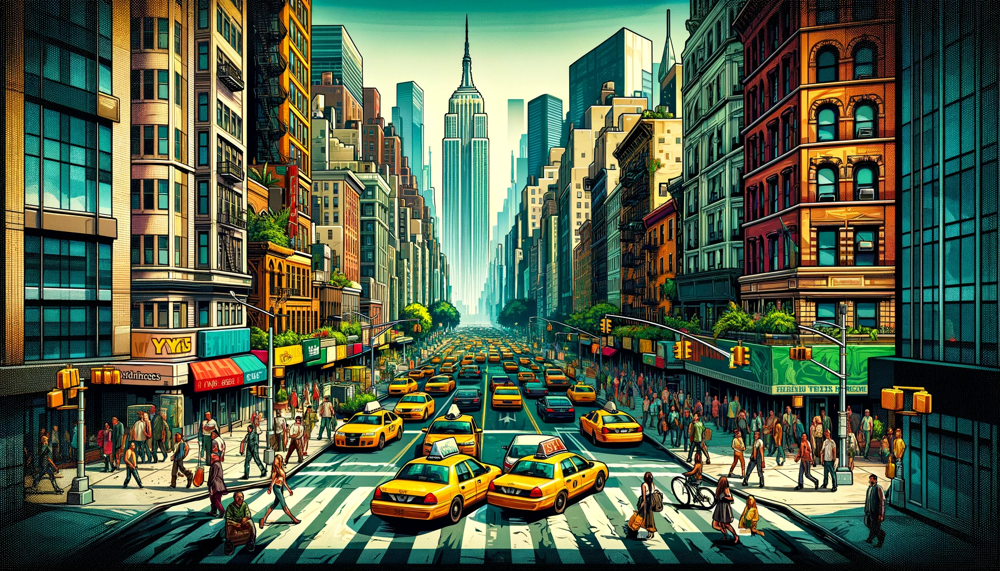

In [2]:
# The code makes sure that once there is change in the 'src/' folder, the 
# change will be automatically reloaded in the notebook.
%reload_ext autoreload
%autoreload 2
%aimport src

### Task 1: Understanding the Data

Yellow and green taxi trip records include fields capturing 
- pick-up and drop-off dates/times
- pick-up and drop-off locations
- trip distances
- itemized fares
- rate types
- payment types
- driver-reported passenger counts 
  
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) by technology providers authorized under the Taxicab & Livery Passenger Enhancement Programs (TPEP/LPEP). The trip data was not created by the TLC, and TLC makes no representations as to the accuracy of these data.

**Remark**: Feel free to change the *months* and *year* in the code below, if you need more/less data. 

In [3]:
import pandas as pd
from src.utils import load_data_from_google_drive

# Define the base URLs for the yellow and green taxi data
base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'

# Define the months and year you're interested in
# We have choosen the first quarter in year 2022
months = ['01', '02', '03']
year = '2022'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow = pd.concat(df_yellow_list)
df_green = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [4]:
# We make sure that our data follow the date we have choosen 
df_yellow.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
0,1,2022-01-01 00:35:40,2022-01-01 00:53:29,2.0,3.80,1.0,N,142,236,1,14.5,3.0,0.5,3.65,0.0,0.3,21.95,2.5,0.0
1,1,2022-01-01 00:33:43,2022-01-01 00:42:07,1.0,2.10,1.0,N,236,42,1,8.0,0.5,0.5,4.00,0.0,0.3,13.30,0.0,0.0
2,2,2022-01-01 00:53:21,2022-01-01 01:02:19,1.0,0.97,1.0,N,166,166,1,7.5,0.5,0.5,1.76,0.0,0.3,10.56,0.0,0.0
3,2,2022-01-01 00:25:21,2022-01-01 00:35:23,1.0,1.09,1.0,N,114,68,2,8.0,0.5,0.5,0.00,0.0,0.3,11.80,2.5,0.0
4,2,2022-01-01 00:36:48,2022-01-01 01:14:20,1.0,4.30,1.0,N,68,163,1,23.5,0.5,0.5,3.00,0.0,0.3,30.30,2.5,0.0


In [5]:
# We make sure that we have all the data so we check the last 5 rows
df_yellow.tail(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
3627877,2,2022-03-31 23:45:00,2022-04-01 00:01:00,NaN,3.57,NaN,None,48,262,0,18.33,0.0,0.5,1.00,0.0,0.3,22.63,NaN,NaN
3627878,2,2022-03-31 23:59:39,2022-04-01 00:06:09,NaN,2.04,NaN,None,48,238,0,9.75,0.0,0.5,2.00,0.0,0.3,15.05,NaN,NaN
3627879,2,2022-03-31 23:50:00,2022-04-01 00:08:00,NaN,0.59,NaN,None,48,4,0,17.33,0.0,0.5,2.23,0.0,0.3,22.86,NaN,NaN
3627880,2,2022-03-31 23:25:56,2022-03-31 23:32:37,NaN,1.26,NaN,None,158,68,0,8.80,0.0,0.5,2.57,0.0,0.3,14.67,NaN,NaN
3627881,2,2022-03-31 23:08:00,2022-03-31 23:17:00,NaN,1.66,NaN,None,112,256,0,8.80,0.0,0.5,1.82,0.0,0.3,11.42,NaN,NaN


In [6]:
df_green.head(5)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2022-01-01 00:14:21,2022-01-01 00:15:33,N,1.0,42,42,1.0,0.44,3.5,0.50,0.5,0.00,0.0,None,0.3,4.80,2.0,1.0,0.00
1,1,2022-01-01 00:20:55,2022-01-01 00:29:38,N,1.0,116,41,1.0,2.10,9.5,0.50,0.5,0.00,0.0,None,0.3,10.80,2.0,1.0,0.00
2,1,2022-01-01 00:57:02,2022-01-01 01:13:14,N,1.0,41,140,1.0,3.70,14.5,3.25,0.5,4.60,0.0,None,0.3,23.15,1.0,1.0,2.75
3,2,2022-01-01 00:07:42,2022-01-01 00:15:57,N,1.0,181,181,1.0,1.69,8.0,0.50,0.5,0.00,0.0,None,0.3,9.30,2.0,1.0,0.00
4,2,2022-01-01 00:07:50,2022-01-01 00:28:52,N,1.0,33,170,1.0,6.26,22.0,0.50,0.5,5.21,0.0,None,0.3,31.26,1.0,1.0,2.75


In [7]:
# We do the same for the green taxi to make sure we have all the data for the quarter
df_green.tail(5)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
78532,2,2022-03-31 23:14:00,2022-03-31 23:40:00,None,NaN,7,239,NaN,4.91,20.68,0.0,0.0,10.00,0.0,None,0.3,33.73,NaN,NaN,NaN
78533,2,2022-03-31 23:03:00,2022-03-31 23:17:00,None,NaN,80,25,NaN,5.08,18.54,0.0,0.0,4.19,0.0,None,0.3,23.03,NaN,NaN,NaN
78534,2,2022-03-31 23:28:00,2022-03-31 23:45:00,None,NaN,33,181,NaN,2.81,13.44,0.0,0.0,3.05,0.0,None,0.3,16.79,NaN,NaN,NaN
78535,2,2022-03-31 23:58:00,2022-04-01 00:07:00,None,NaN,97,49,NaN,1.43,8.80,0.0,0.0,2.02,0.0,None,0.3,11.12,NaN,NaN,NaN
78536,2,2022-03-31 23:11:00,2022-03-31 23:16:00,None,NaN,226,7,NaN,1.47,13.88,0.0,0.0,0.79,0.0,None,0.3,14.97,NaN,NaN,NaN


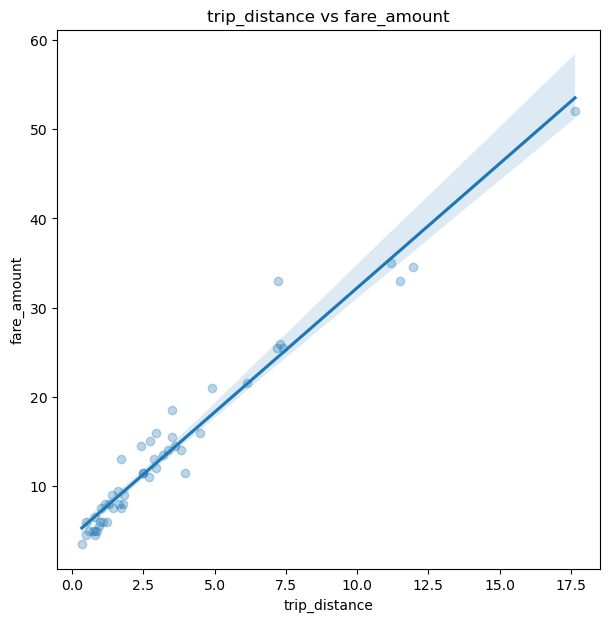

In [8]:
from src.utils import create_scatterplot
# With the scatterplot we check if there is a correlation between trip distance and fare amount with the plot
create_scatterplot(
    df_yellow.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',
)

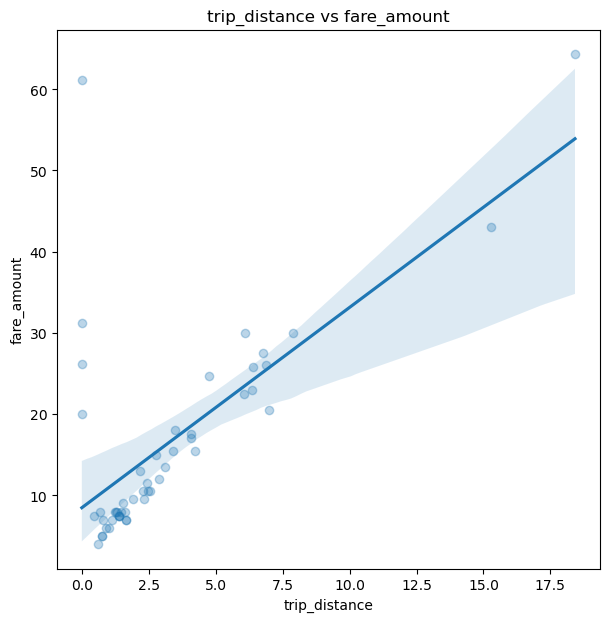

In [9]:
# We do the same for the green taxi
create_scatterplot(
    df_green.sample(50), 
    x_col = 'trip_distance', 
    y_col = 'fare_amount', 
    title = 'trip_distance vs fare_amount', 
    xlabel = 'trip_distance',
    ylabel = 'fare_amount',
)

We have also made some decisions based on what we think the data represents, therefore:

Trip_distance is with the unit km therefore does 1.0 correspond to 1 km
fare_amount is with the unit dollars therefore does 1.0 correspond to 1 dollar

### Task 2: Exploratory Data Analysis
Conduct exploratory data analysis to understand the patterns and relationships in the data. This includes analyzing the distribution of trip distances, fares, and passenger counts, as well as the relationship between these variables.

Length and Descriptive statistics


In [11]:
# First we want to know how many rows we have for the yellow taxi
len(df_yellow)

9071244

In [12]:
# Then we want to look at the descriptive statistic as we can use it later to filter
df_yellow[['passenger_count', 'trip_distance', 'fare_amount']].describe()

,passenger_count,trip_distance,fare_amount
count,8.780189e+06,9.071244e+06,9.071244e+06
mean,1.390163e+00,5.685593e+00,1.340192e+01
std,9.794085e-01,5.889151e+02,1.337637e+02
min,0.000000e+00,0.000000e+00,-8.950000e+02
25%,1.000000e+00,1.080000e+00,6.500000e+00
50%,1.000000e+00,1.800000e+00,9.500000e+00
75%,1.000000e+00,3.250000e+00,1.450000e+01
max,9.000000e+00,3.487985e+05,4.010923e+05


In [13]:
# We do the same for the green taxi
len(df_green)

210431

In [14]:
# And we look as well at the descriptive statistic for the green taxi
df_green[['passenger_count', 'trip_distance', 'fare_amount']].describe()

,passenger_count,trip_distance,fare_amount
count,188650.000000,210431.000000,210431.000000
mean,1.276056,79.659012,14.155726
std,0.911651,2969.436405,12.457393
min,0.000000,0.000000,-165.000000
25%,1.000000,1.100000,7.500000
50%,1.000000,1.930000,10.500000
75%,1.000000,3.600000,17.000000
max,9.000000,259777.570000,604.500000


Filtering with Trip Distance

In [15]:
# We want to look at two columns to filter which are distance and fare amount

In [16]:
# This line filters trips, for the yellow taxis, which are longer than 10 km from our data
# We have chosen to exclude trips longer than 10 km based on the graph from task 1 as we see that few trips are longer than 10 km
# As we also can see in the descriptive statistic where 75% is equal 3,2 km or lower
# Another argument for choosing to exclude trips longer than 10 km is that Manhatten is 10 km long.
df_yellow_filter = df_yellow[df_yellow['trip_distance']<10]  

In [17]:
# We want to make sure that the code contains the limit of 10 km by checking the upper bound 
df_yellow_filter.sort_values('trip_distance').tail()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
1322060,2,2022-02-14 10:33:06,2022-02-14 11:11:32,1.0,9.99,1.0,N,138,243,1,32.5,0.0,0.5,6.16,6.55,0.3,47.26,0.0,1.25
844131,2,2022-03-08 16:55:53,2022-03-08 17:29:27,1.0,9.99,1.0,N,264,249,1,32.5,1.0,0.5,0.00,6.55,0.3,44.60,2.5,1.25
2771325,2,2022-02-27 21:06:54,2022-02-27 21:29:41,1.0,9.99,1.0,N,138,79,1,30.0,0.5,0.5,8.07,6.55,0.3,49.67,2.5,1.25
230163,2,2022-01-04 15:23:08,2022-01-04 16:02:02,1.0,9.99,1.0,N,132,225,1,35.5,0.0,0.5,9.39,0.00,0.3,46.94,0.0,1.25
2930666,2,2022-03-27 00:50:26,2022-03-27 01:10:28,1.0,9.99,1.0,N,132,160,2,28.5,0.5,0.5,0.00,0.00,0.3,31.05,0.0,1.25


In [18]:
# As well as setting an upper bound we want to set a lower bound for distance
# We conclude that a trip less than 500 meters is not a represented trip 
df_yellow_filter1 = df_yellow_filter[df_yellow_filter['trip_distance']>0.5]

In [19]:
# We now make sure that the data has a lower bound of 500 meters
df_yellow_filter1.sort_values('trip_distance').head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee
2355299,2,2022-02-24 10:18:11,2022-02-24 10:24:09,1.0,0.51,1.0,N,141,140,2,5.0,0.0,0.5,0.00,0.0,0.3,8.30,2.5,0.0
1422629,2,2022-01-20 08:24:27,2022-01-20 08:28:24,1.0,0.51,1.0,N,141,141,1,4.5,0.0,0.5,1.56,0.0,0.3,9.36,2.5,0.0
565758,2,2022-03-05 19:45:18,2022-03-05 19:47:13,1.0,0.51,1.0,N,164,234,1,3.5,0.0,0.5,1.36,0.0,0.3,8.16,2.5,0.0
2630,2,2022-03-01 05:42:53,2022-03-01 05:44:59,1.0,0.51,1.0,N,236,236,1,4.0,0.5,0.5,1.56,0.0,0.3,9.36,2.5,0.0
2205770,2,2022-01-28 22:37:25,2022-01-28 22:39:06,1.0,0.51,1.0,N,43,142,2,4.0,0.5,0.5,0.00,0.0,0.3,7.80,2.5,0.0


In [20]:
#We do the same for the green taxi using the same lower and upper bound
df_green_filter = df_green[df_green['trip_distance']<10]

In [21]:
df_green_filter.sort_values('trip_distance').tail()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
66266,2,2022-03-30 11:46:03,2022-03-30 12:13:38,N,1.0,74,183,1.0,9.99,32.00,0.0,0.5,6.56,0.00,None,0.3,39.36,1.0,1.0,0.00
53843,2,2022-03-24 21:40:25,2022-03-24 22:01:11,N,1.0,244,170,1.0,9.99,29.50,0.5,0.5,6.71,0.00,None,0.3,40.26,1.0,1.0,2.75
64876,2,2022-02-11 07:30:00,2022-02-11 08:19:00,None,NaN,198,142,NaN,9.99,38.56,0.0,0.0,5.00,6.55,None,0.3,53.16,NaN,NaN,NaN
16224,2,2022-01-10 11:33:14,2022-01-10 11:54:11,N,1.0,134,179,1.0,9.99,29.50,0.0,0.5,0.00,0.00,None,0.3,30.30,2.0,1.0,0.00
2092,2,2022-02-01 23:35:11,2022-02-01 23:55:50,N,1.0,92,258,1.0,9.99,29.00,0.5,0.5,2.00,0.00,None,0.3,32.30,1.0,1.0,0.00


In [22]:
df_green_filter1 = df_green_filter[df_green_filter['trip_distance']>0.5]

In [23]:
df_green_filter1.sort_values('trip_distance').head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
8369,2,2022-01-05 18:03:14,2022-01-05 18:06:27,N,1.0,247,247,1.0,0.51,4.0,1.0,0.5,0.0,0.0,None,0.3,5.8,2.0,1.0,0.0
46994,2,2022-01-26 12:06:36,2022-01-26 12:10:40,N,1.0,196,196,1.0,0.51,4.5,0.0,0.5,0.0,0.0,None,0.3,5.3,2.0,1.0,0.0
47205,2,2022-01-26 14:22:55,2022-01-26 14:25:25,N,1.0,74,41,1.0,0.51,4.0,0.0,0.5,1.0,0.0,None,0.3,5.8,1.0,1.0,0.0
54288,2,2022-03-25 07:57:50,2022-03-25 08:02:24,N,1.0,74,41,1.0,0.51,5.0,0.0,0.5,0.0,0.0,None,0.3,5.8,2.0,1.0,0.0
12455,2,2022-01-07 22:02:49,2022-01-07 22:06:42,N,1.0,95,95,2.0,0.51,4.5,0.5,0.5,0.0,0.0,None,0.3,5.8,2.0,1.0,0.0


array([[<Axes: title={'center': 'trip_distance'}>]], dtype=object)

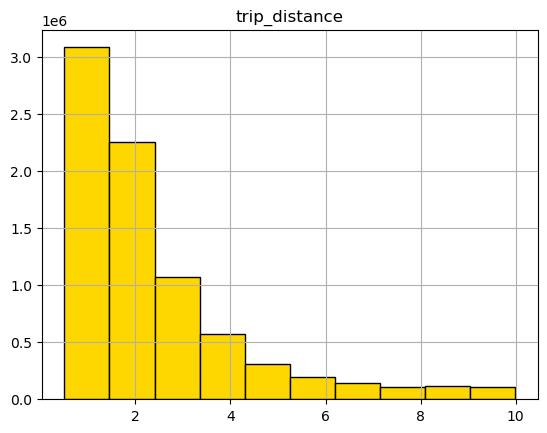

In [24]:
# To get a more visualized picture of trip distance we plot the data over number of trips as a histogram
# There are more trips with a lower distance than longer distance
# The data is represented as a distribution
df_yellow_filter1.hist('trip_distance', color='gold', edgecolor='black')

array([[<Axes: title={'center': 'trip_distance'}>]], dtype=object)

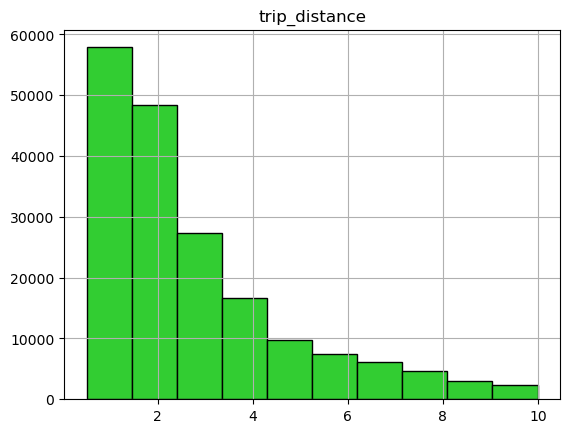

In [25]:
# We do the same for the green taxi 
# As well for the green taxi wee see more trips for at lower distance
df_green_filter1.hist('trip_distance', color='limegreen', edgecolor='black')

In [26]:
import matplotlib.pyplot as plt

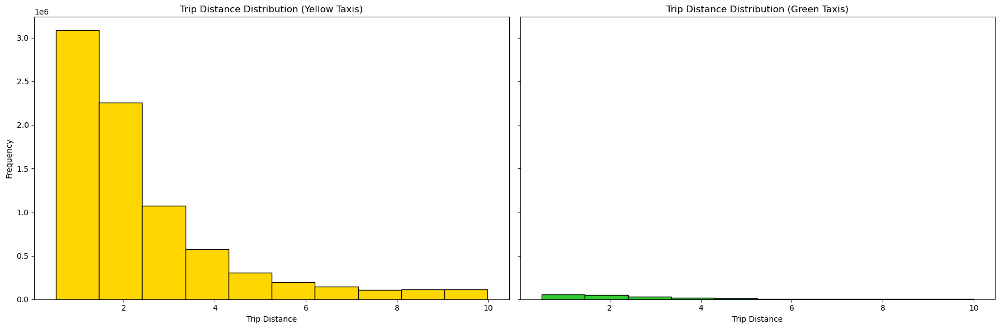

In [27]:
# Make plots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6), sharey=True)

# Plot for yellow taxis
axes[0].hist(df_yellow_filter1['trip_distance'], color='gold', edgecolor='black')
axes[0].set_title('Trip Distance Distribution (Yellow Taxis)')
axes[0].set_xlabel('Trip Distance')
axes[0].set_ylabel('Frequency')

# Plot for green taxis
axes[1].hist(df_green_filter1['trip_distance'], color='limegreen', edgecolor='black')
axes[1].set_title('Trip Distance Distribution (Green Taxis)')
axes[1].set_xlabel('Trip Distance')

plt.tight_layout()
plt.show()

# We see that the yellow taxi has more data than the green one
# Overall we see that there are more trips with a shorter distance

In [29]:
#Now we want to filter the fare amount

In [30]:
#As we can see in the descriptive statistic from df_yellow we have 145 dollars as the higehst for 75% 
df_yellow_filter2 = df_yellow_filter1[df_yellow_filter1['fare_amount']<150]

In [31]:
#For the lower bound a negative amount makes no sense 
df_yellow_filter3 = df_yellow_filter2[df_yellow_filter2['fare_amount']>=0]

In [32]:
# We do the same for the green taxi
df_green_filter2 = df_green_filter1[df_green_filter1['fare_amount']<150]

In [33]:
#Størstedelen af dataen ligger over 0 og en negativ pris giver mening se beskrivende statestik
df_green_filter3 = df_green_filter2[df_green_filter2['fare_amount']>=0]

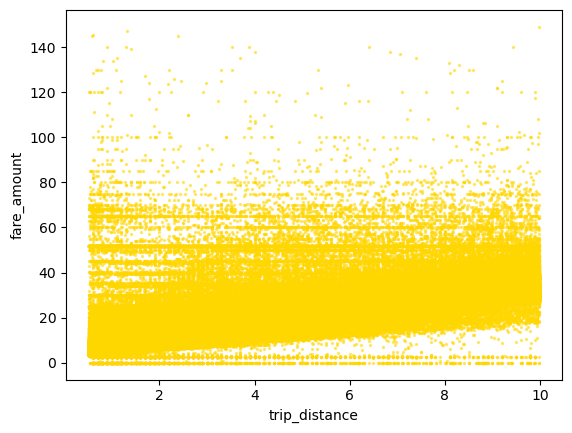

In [34]:
# We will like to plot the two filters trip distance and fare amount
# We will like to check if we can see a correlation between the trip distance and fare amount 
# But not the expected correlation for an example do the price go up or down after certain distance
# The scatter plot shows that most of the data follow a linear correlation between the amount and distance
# the longer you travel the more you have to pay

ax = df_yellow_filter3.plot(x='trip_distance', y='fare_amount', s=2, c='gold', alpha=0.5, kind='scatter')

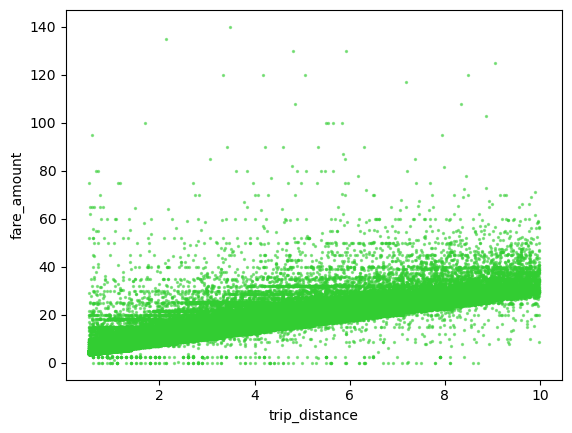

In [35]:
# We want to show the same for the green taxi
# and we can conclude the same trend 
ax = df_green_filter3.plot(x='trip_distance', y='fare_amount', s=2, c='limegreen', alpha=0.5, kind='scatter')

Length and Descriptive statistics with Filtered data

In [36]:
# We want to check how much data we have excluded to see if the data is still represented for the orginial
# For the yellow taxi we started with 9 mio. and after the filters we have 7,9 mio.
# We have sorted about 13% of the data
len(df_yellow_filter3)

7943683

In [37]:
# We make some descriptive statistic to conclude if the data is still represented for the orginal
# The orginal df_yellow has a 75% upper bound of 3,2 km and after the filters for df_yellow_filter3 the upper bound is 2,9 km
# For the lower bound of trip distance 25% the orignal has an lower bound of 1,08 km and after the filters it is 1,1 km

# We check the same for the fare amount
# Which shows that df_yellow have an 75% upper bound of 145 dollars and after the filters the upper bound is 135 dollars
# We of course do the same for the lower bound which shows that the df_yellow has 6,5 dollars fare amount and df_yellow_filter3 has a lower bound of 7 dollars

#Therefor we can conclude that the original data is still represented after the filters for the yellow taxi
#because of the small differences
description = df_yellow_filter3[['passenger_count', 'trip_distance', 'fare_amount']].describe()
print(description)

       passenger_count  trip_distance   fare_amount
count     7.686247e+06   7.943683e+06  7.943683e+06
mean      1.389379e+00   2.380104e+00  1.105594e+01
std       9.837804e-01   1.870166e+00  6.138650e+00
min       0.000000e+00   5.100000e-01  0.000000e+00
25%       1.000000e+00   1.120000e+00  7.000000e+00
50%       1.000000e+00   1.780000e+00  9.500000e+00
75%       1.000000e+00   2.900000e+00  1.350000e+01
max       8.000000e+00   9.990000e+00  1.490000e+02


In [38]:
# We want to check the same for the green taxi to see how much data is excluded 
# We started with 210431 and now we have 183368 
# Therefor we sorted about 13% as well
len(df_green_filter3)

183368

In [39]:
# As we did for the yellow taxi we want to check if the data for the green taxi also is represented

# The trip distance 75% upper bound for df_green is 3,5 km and the upper bound for the df_green_filter3 is also 3,5 km
# We check the 25% lower bound as well which is 1,3 km for the original data and after filters the 25% is 2,1 km

# We compare for fare amount for the green taxi
# The upper bound of 75% for the df_green is 17 dollars and for the filter data the amount is 15,5 dollars
# And again we do the same for the 25% lower bound. The orginal data has the amount of 7,5 dollars and the filter data has the amount of also 7,5 dollars

# Therefor we conclude again that the difference between the orginal and the filtered data is closed to be represented as the same

description = df_green_filter3[['passenger_count', 'trip_distance', 'fare_amount']].describe()
print(description)

       passenger_count  trip_distance    fare_amount
count    164495.000000  183368.000000  183368.000000
mean          1.287595       2.748125      12.598641
std           0.931344       2.019247       7.320078
min           0.000000       0.510000       0.000000
25%           1.000000       1.300000       7.500000
50%           1.000000       2.060000      10.500000
75%           1.000000       3.570000      15.500000
max           9.000000       9.990000     140.000000


Passenger Count

In [40]:
# We don't want to filter the passenger count as we don't see any special outliers or meaning of the filter for that column

<Axes: xlabel='passenger_count'>

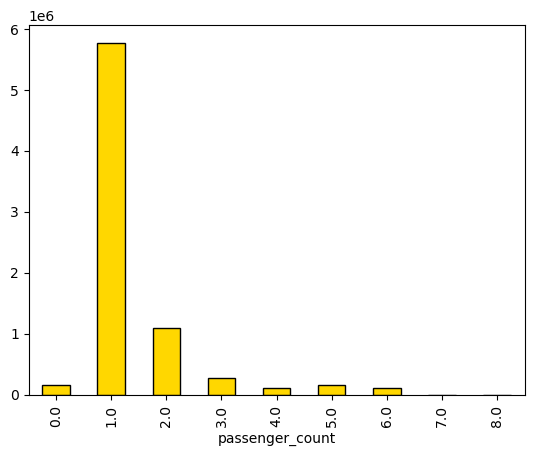

In [41]:
# We want to make a vertical barchart for passenger counts to see how many people who take the yellow taxi
# As we can see for the yellow taxi typically only one person takes a taxi with a number of over 5 million
# The interesting is that it is more common that 5 people will travel in the taxi than 4 people

passenger_count_counts = df_yellow_filter3['passenger_count'].value_counts().sort_index()
passenger_count_counts.plot(kind='bar', color='gold', edgecolor='black')

<Axes: xlabel='passenger_count'>

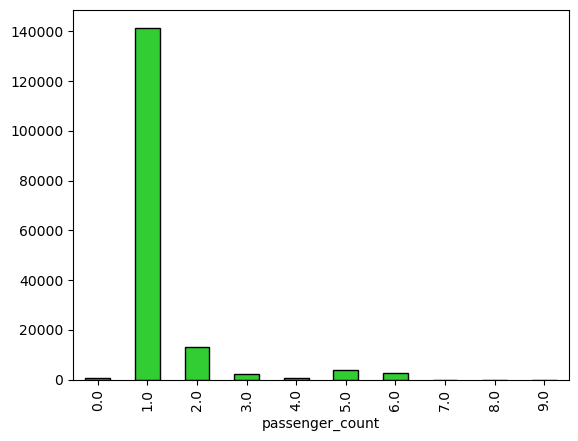

In [42]:
# We do the same for the green taxi 
# We see the same for the green taxi that it is typically just one person who takes the taxi with a number of 130000
# As well as the yellow taxi it's common that 5 or 6 people travel with the taxi than 4 people

passenger_count_counts1 = df_green_filter3['passenger_count'].value_counts().sort_index()

passenger_count_counts1.plot(kind='bar', color='limegreen', edgecolor='black')


Other correlations

In [43]:
# We want to check if there is a further correlation between passenger counts and fare amount 

trip_passanger_correlation = df_yellow_filter3['passenger_count'].corr(df_yellow_filter3['fare_amount'])

In [44]:
# As we can see below there is no correlation and therefor we don't go further with this
print(trip_passanger_correlation)

0.005434878355639658


In [45]:
from statistics import mode

In [46]:
import numpy as np

**Textbook Practice**:
Apply the principle of "choosing an effective visual" in Chapter 2 to make the visualization. Explain how this principle is applied.


Chapter 2 discusses the different ways to visualize data. We have used visualizations such as vertical bar charts, tables, and points, including scatterplots. These are three of the most common and straightforward ways to display data. This approach makes it easier for the reader to understand and simpler to produce.

Vertical bar charts have been used to visualize trip distance and passenger count. This type of visualization is good for providing an easy overview, both of the values and their development, as well as for making comparisons. In our case, we found that the distances for the two types of taxis are very similar.

Tables have been used to visualize "description." This type of visualization serves as an easy way to get an overview of a large amount of data. However, the reader needs to stop and read the numbers based on the rows and columns in the table. The visualization of the numbers provides ample opportunities to compare individual figures that may be of interest to the reader. In our elaboration and analysis, we describe...

We also used scatterplots as a form of visualization. See [108] [109]. Plots, in general, are a good way to show the relationship between two things. They allow one to see and visualize connections that might not be apparent from the numbers alone. We used this visualization to examine the relationship between trip distance and fare amount. In the same figure, we also used line visualization, which in this case provided a better understanding of the correlation between the amount paid and the distance traveled in a taxi.

The advantage of using scatterplots in this particular visualization is that they show all the trips that do not follow the general trend, as well as what one might call "extremes." Even though there is clearly a general trend, it is still evident that there are many trips that do not follow this trend.


### Task 3: Spatial Analysis
Use Kepler.gl (https://kepler.gl/) or similar tools/packages to visualize the spatial patterns of taxi rides. This includes the pickup and dropoff locations, as well as the routes taken. Analyze the spatial patterns to identify hotspots of taxi demand.

You can find a good tutorial on https://docs.kepler.gl/docs/keplergl-jupyter#install for how to use it in jupyter notebook with python.

**Hint** In order to visualize the pickup/dropoff location geographically, you might need to know the latitude (lat) and longitude (lng) for each location. You can find the corresponding information in the dataframe "df_zones".

In [48]:
df_zones.head(5)

,Shape_Leng,Shape_Area,zone,LocationID,borough,lat,lng
0,0.116357,0.000782,Newark Airport,1,EWR,40.689516,-74.176786
1,0.433470,0.004866,Jamaica Bay,2,Queens,40.625724,-73.826126
2,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,40.865888,-73.849479
3,0.043567,0.000112,Alphabet City,4,Manhattan,40.724152,-73.977023
4,0.092146,0.000498,Arden Heights,5,Staten Island,40.550340,-74.189930


In [49]:
pip install ipywidgets


Note: you may need to restart the kernel to use updated packages.


In [50]:
import ipywidgets as widgets
widgets.IntSlider()


IntSlider(value=0)

In [51]:
pip install keplergl

In [52]:
df_yellow_filter3.replace([np.inf, -np.inf], np.nan, inplace=True)


C:\Users\julie\AppData\Local\Temp\ipykernel_29052\2900758785.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_yellow_filter3.replace([np.inf, -np.inf], np.nan, inplace=True)


In [53]:
df_yellow_filter3.fillna(0, inplace=True)

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\4041570457.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_yellow_filter3.fillna(0, inplace=True)


In [54]:
# Removing duplicates by keeping the first occurrence
df_zones = df_zones.drop_duplicates(subset='LocationID', keep='first')
start_time = '2022-01-03 10:00:00' 
end_time = '2022-01-03 12:00:00'
selected_columns = ['tpep_pickup_datetime','tpep_dropoff_datetime','PULocationID','DOLocationID','fare_amount',]
df_yellow_selected = df_yellow_filter3[(df_yellow_filter3['tpep_pickup_datetime'] >= start_time) &(df_yellow_filter3['tpep_pickup_datetime'] <= end_time)][selected_columns]
pickup_locations = df_yellow_selected.join(df_zones.set_index('LocationID'), on="PULocationID", how='left')
pickup_locations = pickup_locations.rename({'lat': 'pickup_lat', 'lng': 'pickup_lng'}, axis=1)[['pickup_lat', 'pickup_lng']]
dropoff_locations = df_yellow_selected.join(df_zones.set_index('LocationID'), on="DOLocationID", how='left')
dropoff_locations = dropoff_locations.rename({'lat': 'dropoff_lat', 'lng': 'dropoff_lng'}, axis=1)[['dropoff_lat', 'dropoff_lng']]
for col in pickup_locations.columns:df_yellow_selected[col] = pickup_locations[col]
for col in dropoff_locations.columns:df_yellow_selected[col] = dropoff_locations[col]
from keplergl import KeplerGl
map=KeplerGl(height=600,data={'yellow_taxi':df_yellow_selected})
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


c:\Users\julie\anaconda3\Lib\site-packages\jupyter_client\session.py:721: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


KeplerGl(data={'yellow_taxi':         tpep_pickup_datetime tpep_dropoff_datetime  PULocationID  \
97175    202…

In the image here under, it can be seen all the trip, including pickup and dropoff for both yellow and green taxis. 
The generel trends can the yellow taxis has alot of trip to and from LaGuardia Airport. The yellow taxis is of course more used, and operate more in southern part of New York. 
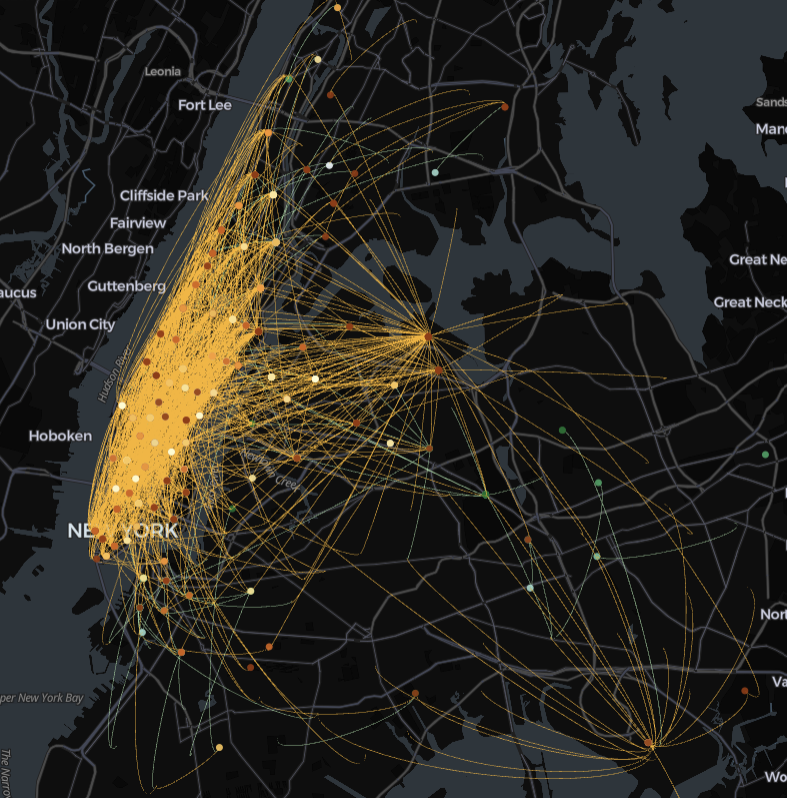

On the other hand, the green taxis is more operating in the northern part, as seen on the picture below, where there only is shown the green taxis and their routes. 
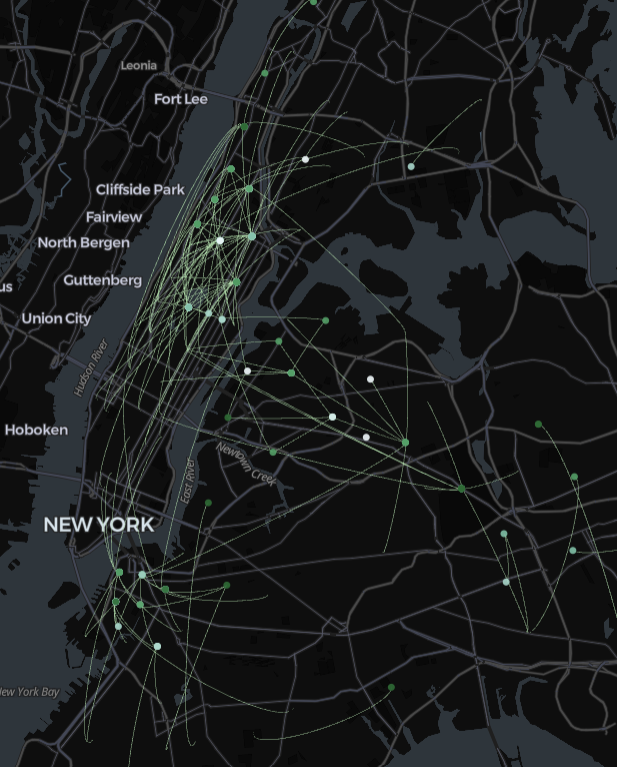

**Textbook Practice**: Apply the principle "focus your audience's attention" in Chapter 4. Explain briefly how you expect your visualization captures your audience's attention.

Based on what the book says, we have made some diffent decisions based on the chapter. 

We have desided to not use a legend, this is it takes up space and is made unnessesary by making the arcs and dots in the color of taxi they represent.

We have also made use of gradients. The gradints we have chosen are from a dark color of the taxi color to white. This is to draw attention to where most of the taxi trips originate from, with the lesser important spots being in lighter and white color to creat contrast with the more important information.

### Task 4: Temporal Analysis
Analyze the temporal patterns of taxi rides. This includes the number of rides by time of day, day of the week, and month of the year. Also, analyze the relationship between temporal patterns and other variables, such as trip distance and fare.

You can find very good code examples to use on this page https://www.machinelearningplus.com/time-series/time-series-analysis-python/?utm_content=cmp-true

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



Yellow Taxis

In [58]:
df_yellow_filter3.head

<bound method NDFrame.head of          VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0               1  2022-01-01 00:35:40   2022-01-01 00:53:29              2.0   
1               1  2022-01-01 00:33:43   2022-01-01 00:42:07              1.0   
2               2  2022-01-01 00:53:21   2022-01-01 01:02:19              1.0   
3               2  2022-01-01 00:25:21   2022-01-01 00:35:23              1.0   
4               2  2022-01-01 00:36:48   2022-01-01 01:14:20              1.0   
...           ...                  ...                   ...              ...   
3627877         2  2022-03-31 23:45:00   2022-04-01 00:01:00              0.0   
3627878         2  2022-03-31 23:59:39   2022-04-01 00:06:09              0.0   
3627879         2  2022-03-31 23:50:00   2022-04-01 00:08:00              0.0   
3627880         2  2022-03-31 23:25:56   2022-03-31 23:32:37              0.0   
3627881         2  2022-03-31 23:08:00   2022-03-31 23:17:00              0.0  

In [59]:
df_yellow_filter3.loc[:,'tpep_pickup_datetime'] = pd.to_datetime(df_yellow_filter3['tpep_pickup_datetime'], errors='coerce')

In [60]:
#Check NaT-values
print(df_yellow_filter3['tpep_pickup_datetime'].isna().sum)

<bound method Series.sum of 0          False
1          False
2          False
3          False
4          False
           ...  
3627877    False
3627878    False
3627879    False
3627880    False
3627881    False
Name: tpep_pickup_datetime, Length: 7943683, dtype: bool>


In [61]:
df_yellow_filter3.loc[:, 'year_month'] = df_yellow_filter3['tpep_pickup_datetime'].dt.to_period('M')

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\2980760884.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_yellow_filter3.loc[:, 'year_month'] = df_yellow_filter3['tpep_pickup_datetime'].dt.to_period('M')


In [62]:
# Filter data for 2022
df_2022_yellow = df_yellow_filter3[df_yellow_filter3['tpep_pickup_datetime'].dt.year == 2022]

year_month
2022-01    2158350
2022-02    2629799
2022-03    3155441
2022-04         33
2022-05         19
Freq: M, dtype: int64


c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


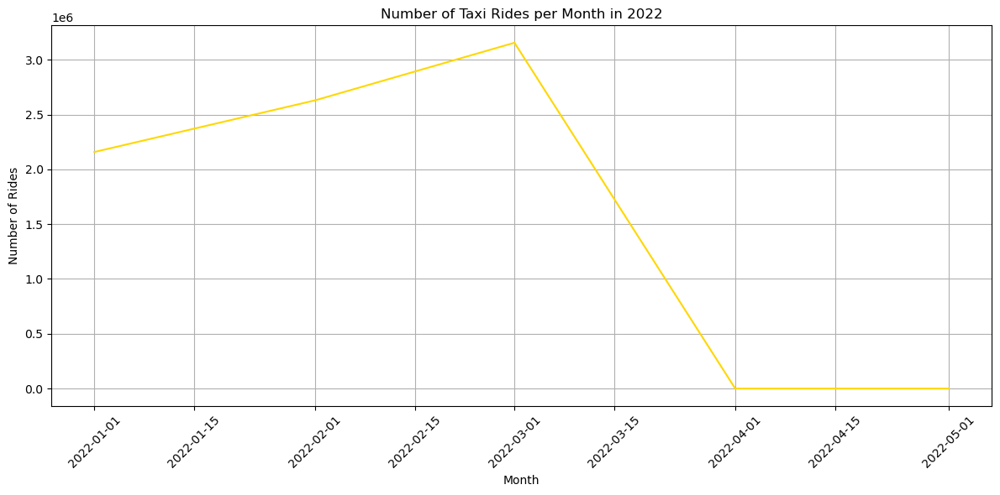

In [63]:
#group
rides_per_month_2022_yellow = df_2022_yellow.groupby('year_month').size()

print(rides_per_month_2022_yellow.head())

# Visualise
rides_per_month_2022_yellow.index = rides_per_month_2022_yellow.index.to_timestamp()

plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_month_2022_yellow.index, y=rides_per_month_2022_yellow.values, color= 'gold')
plt.title('Number of Taxi Rides per Month in 2022')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

the amount of taxis trip in the first quarter of 2022. We see a rise from first of January and later on. This fits with the idea of better weather, more people on the streets. In start January there will also be a possibility to se leftovers from the Christmas Holiday. 
It could also be that the weather in january is so bad that more people take the metro, because taxis are more likely to be backed up on the the streets.

The reason for the drop is because of our focus, so there is no more data from after March. 

year_month_day
2022-03-01    100168
2022-03-02    105728
2022-03-03    113812
2022-03-04    113256
2022-03-05    107622
Freq: D, dtype: int64


c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


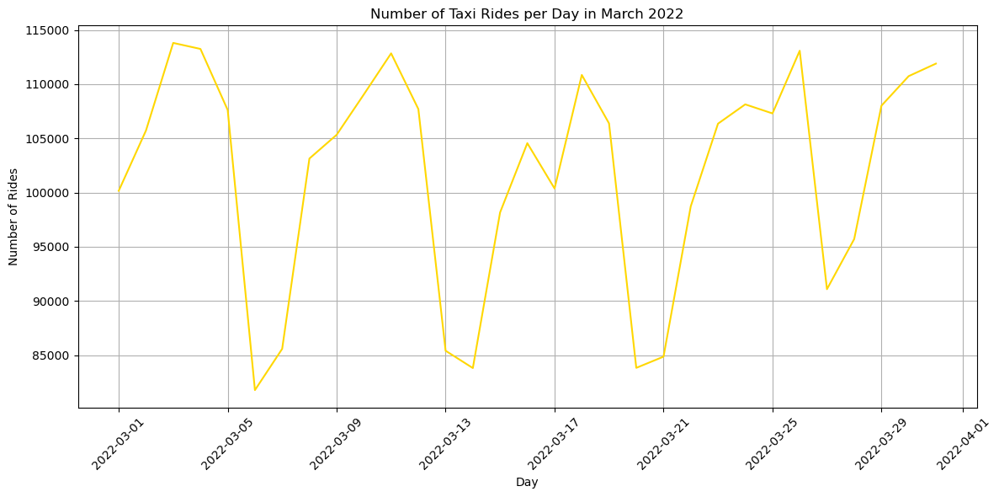

In [82]:

df_yellow_filter3.loc[:, 'year_month_day'] = df_yellow_filter3['tpep_pickup_datetime'].dt.to_period('D')

# Filter on for March of 2022
df_march_2022_yellow = df_yellow_filter3[(df_yellow_filter3['tpep_pickup_datetime'].dt.year == 2022) & (df_yellow_filter3['tpep_pickup_datetime'].dt.month == 3)]

# Group
rides_per_day_march_2022_yellow = df_march_2022_yellow.groupby('year_month_day').size()
print(rides_per_day_march_2022_yellow.head())

# Visualise
rides_per_day_march_2022_yellow.index = rides_per_day_march_2022_yellow.index.to_timestamp()

plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_day_march_2022_yellow.index, y=rides_per_day_march_2022_yellow.values, color= 'gold')

plt.title('Number of Taxi Rides per Day in March 2022')
plt.xlabel('Day')
plt.ylabel('Number of Rides')
plt.grid(True)


plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


We can see on the graf and based on a calender from 2022, that the movment of the graf corresponds to the amount of trips rising going from wensday to saturday and then fall again going from sunday to tursday.

This probably originates from the higher amount of people going out and going out to eat the closer to the weekend. 

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\2095974795.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_yellow_filter3.loc[:, 'pickup_time'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


pickup_time
0    200893
1    137413
2     93561
3     63667
4     38428
dtype: int64


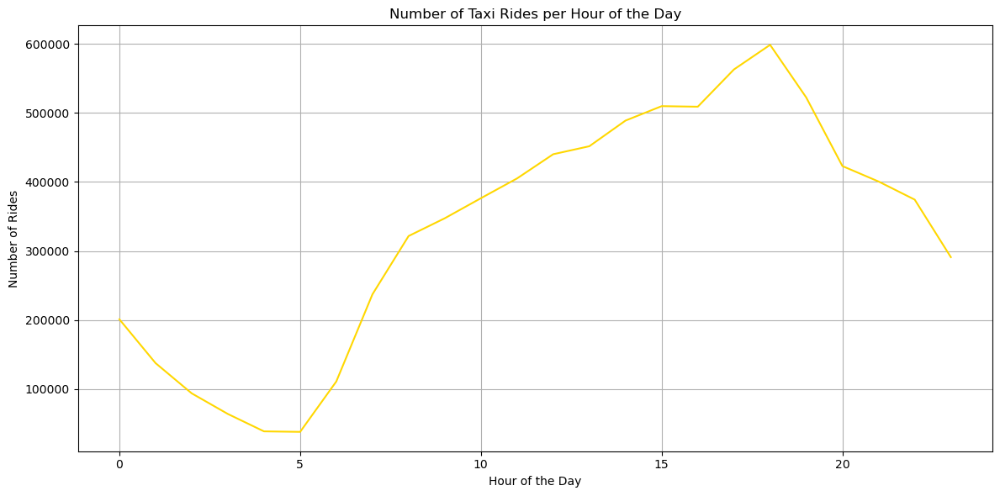

In [65]:

df_yellow_filter3.loc[:, 'pickup_time'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour

# Group
rides_per_hour_yellow = df_yellow_filter3.groupby('pickup_time').size()
print(rides_per_hour_yellow.head())

# Visualise
plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_hour_yellow.index, y=rides_per_hour_yellow.values, color='gold')

plt.title('Number of Taxi Rides per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.grid(True)

plt.tight_layout()
plt.show()

On this graf we can se a clear trend. The trend being that most people take the taxi during the afternoon rush, this graf however might be skewed to these hours by including the trips for fridag and saturday, this would explain why morning rush hour is not as heavily represented 

pickup_time
0    200893
1    137413
2     93561
3     63667
4     38428
dtype: int64


c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


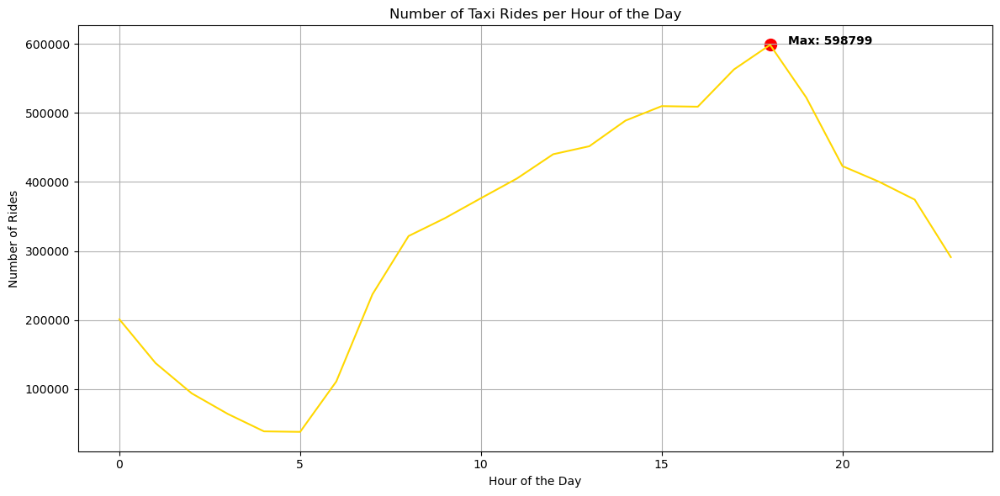

In [66]:
df_yellow_filter3.loc[:, 'pickup_time'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour

# Group
rides_per_hour_yellow = df_yellow_filter3.groupby('pickup_time').size()
print(rides_per_hour_yellow.head())

# Visualise
plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_hour_yellow.index, y=rides_per_hour_yellow.values, color= 'gold')

# Find maxvalues and its position
max_value_yellow = rides_per_hour_yellow.max()
max_index_yellow = rides_per_hour_yellow.idxmax()

# Point and text
plt.scatter(max_index_yellow, max_value_yellow, color='red', marker='o', s=100)
plt.text(max_index_yellow + 0.5, max_value_yellow + 5, f'Max: {max_value_yellow}', horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.title('Number of Taxi Rides per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.grid(True)

plt.tight_layout()
plt.show()


This is the same graf as above, just with visualisation of max value.

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\3916800992.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_yellow_filter3.loc[:, 'hour_of_day'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


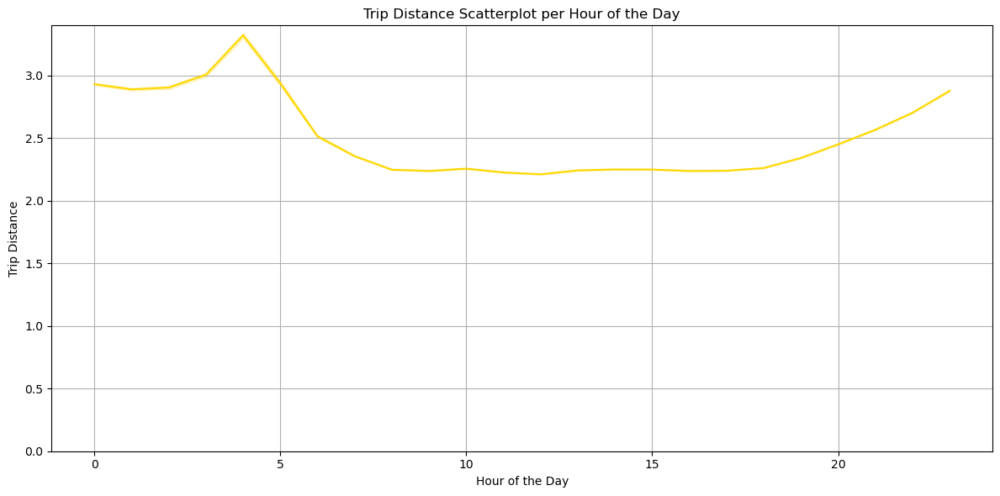

In [67]:

df_yellow_filter3.loc[:, 'hour_of_day'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour

# Plot as scatter
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_yellow_filter3['hour_of_day'], y=df_yellow_filter3['trip_distance'], color='gold')
plt.ylim(bottom=0)

plt.title('Trip Distance Scatterplot per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Trip Distance')
plt.grid(True)

plt.tight_layout()
plt.show()

This graf descripes an interesting trend. it seems that the longest trips are in the morning. Again this graf could be influenced by the fact that the most trips are in the later parts of the day and this washes down the mean. 

c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


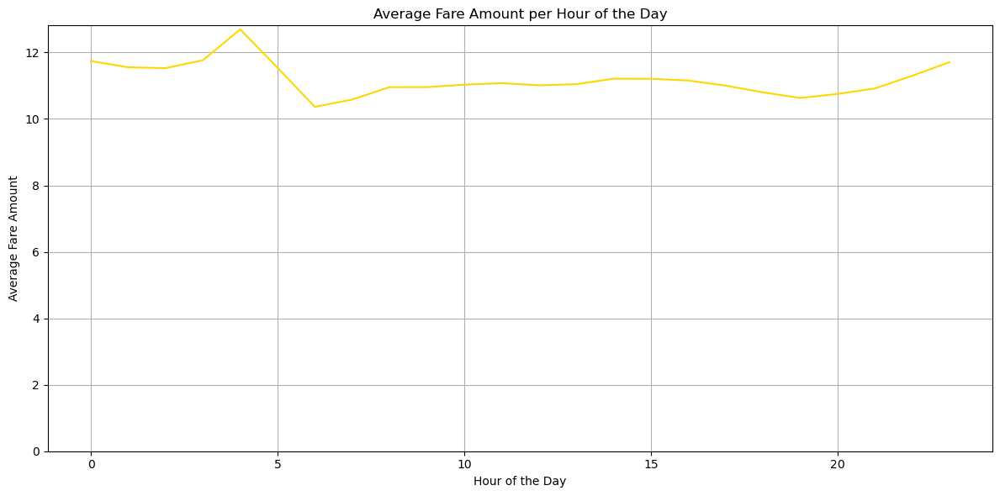

In [68]:
# Take hour of the day
df_yellow_filter3.loc[:, 'hour_of_day'] = df_yellow_filter3['tpep_pickup_datetime'].dt.hour

# Mean fare_amount per time
hourly_avg_fare = df_yellow_filter3.groupby('hour_of_day')['fare_amount'].mean().reset_index()

# Lineplot with mean for fare_amount per time
plt.figure(figsize=(12, 6))
sns.lineplot(x=hourly_avg_fare['hour_of_day'], y=hourly_avg_fare['fare_amount'], color= 'gold')
plt.ylim(bottom=0)

plt.title('Average Fare Amount per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount')
plt.grid(True)

plt.tight_layout()
plt.show()

this graf follows the same trend as the graf above

In [69]:
print(df_yellow_filter3.groupby('hour_of_day')['fare_amount'].mean().reset_index())

    hour_of_day  fare_amount
0             0    11.743548
1             1    11.554784
2             2    11.530125
3             3    11.766753
4             4    12.696108
5             5    11.542329
6             6    10.363511
7             7    10.584295
8             8    10.957414
9             9    10.958472
10           10    11.032352
11           11    11.076721
12           12    11.012401
13           13    11.045971
14           14    11.211691
15           15    11.210046
16           16    11.157867
17           17    11.004845
18           18    10.801796
19           19    10.629695
20           20    10.753326
21           21    10.917623
22           22    11.298328
23           23    11.709777



Green Taxis 

In [70]:
df_green_filter3.head

<bound method NDFrame.head of        VendorID lpep_pickup_datetime lpep_dropoff_datetime store_and_fwd_flag  \
1             1  2022-01-01 00:20:55   2022-01-01 00:29:38                  N   
2             1  2022-01-01 00:57:02   2022-01-01 01:13:14                  N   
3             2  2022-01-01 00:07:42   2022-01-01 00:15:57                  N   
4             2  2022-01-01 00:07:50   2022-01-01 00:28:52                  N   
5             1  2022-01-01 00:47:57   2022-01-01 00:54:09                  N   
...         ...                  ...                   ...                ...   
78532         2  2022-03-31 23:14:00   2022-03-31 23:40:00               None   
78533         2  2022-03-31 23:03:00   2022-03-31 23:17:00               None   
78534         2  2022-03-31 23:28:00   2022-03-31 23:45:00               None   
78535         2  2022-03-31 23:58:00   2022-04-01 00:07:00               None   
78536         2  2022-03-31 23:11:00   2022-03-31 23:16:00               None  

In [71]:
df_green_filter3.loc[:,'lpep_pickup_datetime'] = pd.to_datetime(df_green_filter3['lpep_pickup_datetime'], errors='coerce')

In [72]:
#Check NaT-værdier
print(df_green_filter3['lpep_pickup_datetime'].isna().sum)

<bound method Series.sum of 1        False
2        False
3        False
4        False
5        False
         ...  
78532    False
78533    False
78534    False
78535    False
78536    False
Name: lpep_pickup_datetime, Length: 183368, dtype: bool>


In [73]:
df_green_filter3.loc[:, 'year_month'] = df_green_filter3['lpep_pickup_datetime'].dt.to_period('M')

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\1024140144.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_green_filter3.loc[:, 'year_month'] = df_green_filter3['lpep_pickup_datetime'].dt.to_period('M')


In [74]:
# Filter for only 2022
df_2022_green = df_green_filter3[df_green_filter3['lpep_pickup_datetime'].dt.year == 2022]

year_month
2022-01    54470
2022-02    60729
2022-03    68163
2022-04        1
Freq: M, dtype: int64


c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


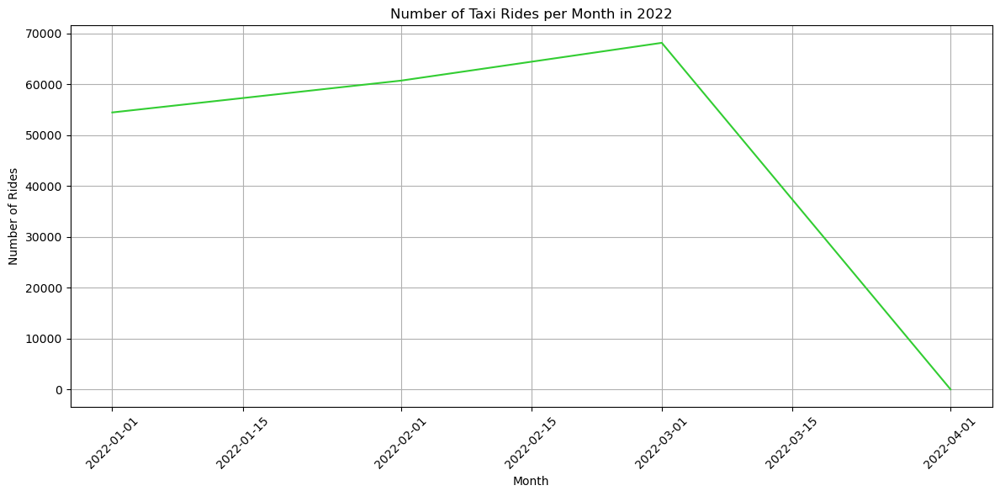

In [75]:
# Group
rides_per_month_2022_green = df_2022_green.groupby('year_month').size()
print(rides_per_month_2022_green.head())

# Visualise
rides_per_month_2022_green.index = rides_per_month_2022_green.index.to_timestamp()

plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_month_2022_green.index, y=rides_per_month_2022_green.values, color= 'limegreen')
plt.title('Number of Taxi Rides per Month in 2022')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

year_month_day
2022-03-01    2278
2022-03-02    2255
2022-03-03    2411
2022-03-04    2421
2022-03-05    1999
Freq: D, dtype: int64


C:\Users\julie\AppData\Local\Temp\ipykernel_29052\2515492331.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_green_filter3.loc[:, 'year_month_day'] = df_green_filter3['lpep_pickup_datetime'].dt.to_period('D')
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


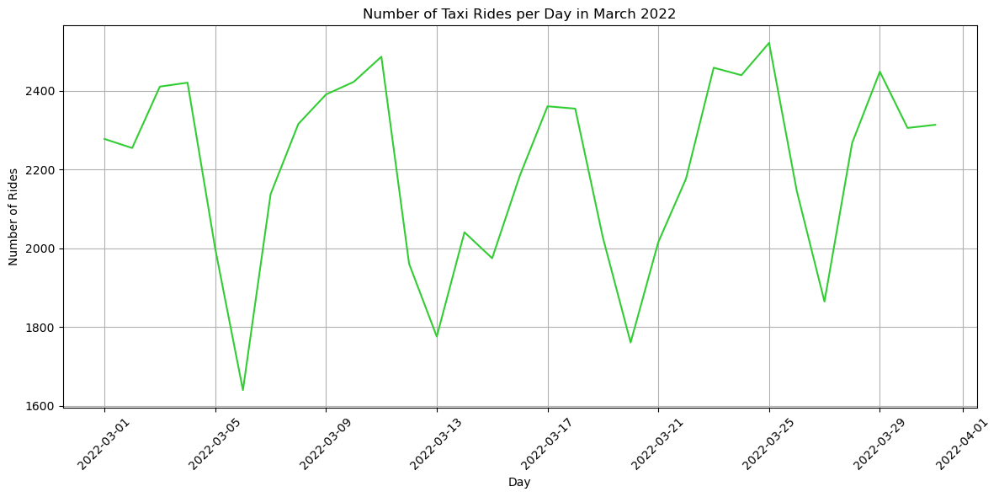

In [76]:

df_green_filter3.loc[:, 'year_month_day'] = df_green_filter3['lpep_pickup_datetime'].dt.to_period('D')

# Filter for March in 2022
df_march_2022_green = df_green_filter3[(df_green_filter3['lpep_pickup_datetime'].dt.year == 2022) & (df_green_filter3['lpep_pickup_datetime'].dt.month == 3)]

# Group
rides_per_day_march_2022_green = df_march_2022_green.groupby('year_month_day').size()
print(rides_per_day_march_2022_green.head())

# Visualise
rides_per_day_march_2022_green.index = rides_per_day_march_2022_green.index.to_timestamp()

plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_day_march_2022_green.index, y=rides_per_day_march_2022_green.values, color= 'limegreen')

plt.title('Number of Taxi Rides per Day in March 2022')
plt.xlabel('Day')
plt.ylabel('Number of Rides')
plt.grid(True)


plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

pickup_time
0    2965
1    2003
2    1298
3     967
4     794
dtype: int64


C:\Users\julie\AppData\Local\Temp\ipykernel_29052\3244851248.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_green_filter3.loc[:, 'pickup_time'] = df_green_filter3['lpep_pickup_datetime'].dt.hour
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


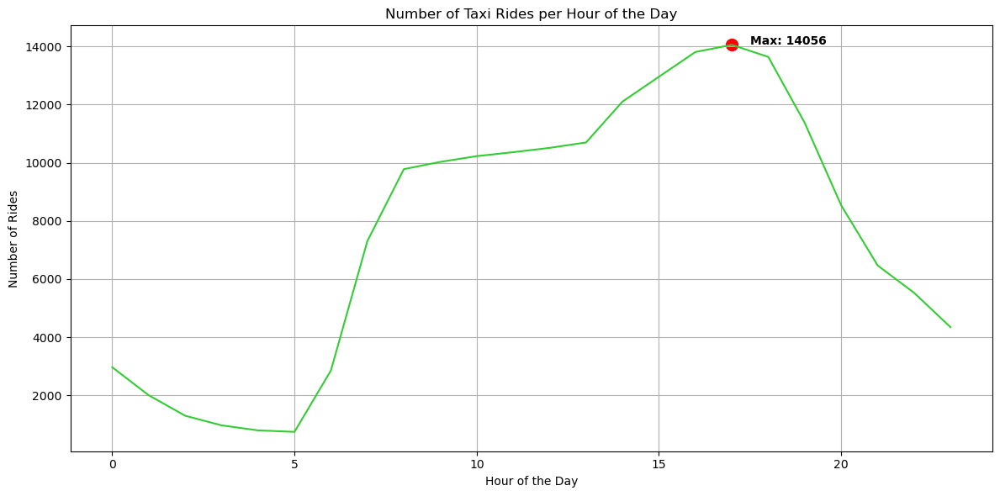

In [77]:

df_green_filter3.loc[:, 'pickup_time'] = df_green_filter3['lpep_pickup_datetime'].dt.hour

# Group data for time of day
rides_per_hour_green = df_green_filter3.groupby('pickup_time').size()
print(rides_per_hour_green.head())

# Visualise
plt.figure(figsize=(12, 6))
sns.lineplot(x=rides_per_hour_green.index, y=rides_per_hour_green.values, color= 'limegreen')

# Find max value and its position
max_value_green = rides_per_hour_green.max()
max_index_green = rides_per_hour_green.idxmax()

# Point and text for max value
plt.scatter(max_index_green, max_value_green, color='red', marker='o', s=100)
plt.text(max_index_green + 0.5, max_value_green + 5, f'Max: {max_value_green}', horizontalalignment='left', size='medium', color='black', weight='semibold')

plt.title('Number of Taxi Rides per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Rides')
plt.grid(True)

plt.tight_layout()
plt.show()

C:\Users\julie\AppData\Local\Temp\ipykernel_29052\1592640451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_green_filter3.loc[:, 'hour_of_day'] = df_green_filter3['lpep_pickup_datetime'].dt.hour
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


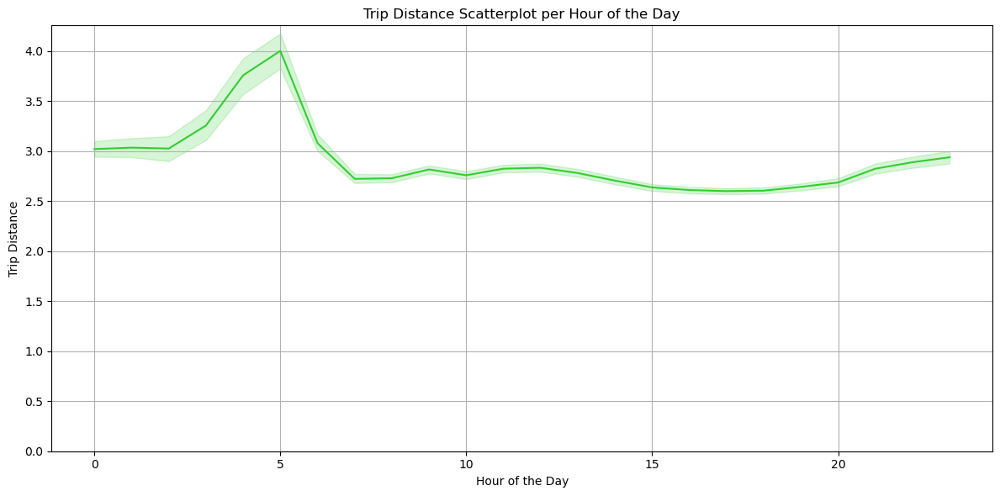

In [78]:
df_green_filter3.loc[:, 'hour_of_day'] = df_green_filter3['lpep_pickup_datetime'].dt.hour

# Plot as scatter
plt.figure(figsize=(12, 6))
sns.lineplot(x=df_green_filter3['hour_of_day'], y=df_green_filter3['trip_distance'], color='limegreen')
plt.ylim(bottom=0)

plt.title('Trip Distance Scatterplot per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Trip Distance')
plt.grid(True)

plt.tight_layout()
plt.show()

c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\julie\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


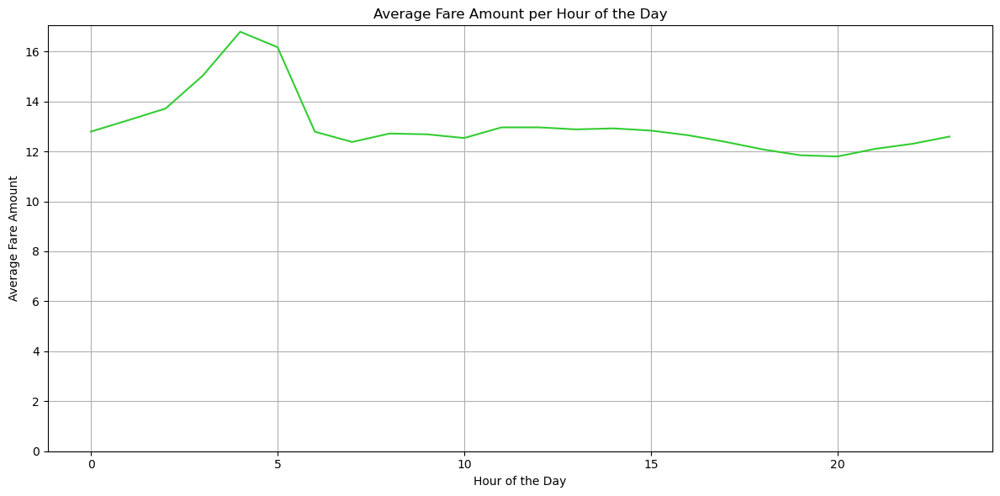

In [79]:
df_green_filter3.loc[:, 'hour_of_day'] = df_green_filter3['lpep_pickup_datetime'].dt.hour

# Mean fare_amount per time
hourly_avg_fare = df_green_filter3.groupby('hour_of_day')['fare_amount'].mean().reset_index()

# Lineplot mean for fare_amount per time
plt.figure(figsize=(12, 6))
sns.lineplot(x=hourly_avg_fare['hour_of_day'], y=hourly_avg_fare['fare_amount'], color= 'limegreen')
plt.ylim(bottom=0)

plt.title('Average Fare Amount per Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Fare Amount')
plt.grid(True)

plt.tight_layout()
plt.show()

All the grafs for the green taxi follow the same trends, this makes sens givin that they orperate in the same area. 

**Textbook Practice**: Use the principle "clutter is your enemy" to simplify your plots/graphs properly. Explain your motivation for each plot.

The principle "clutter is your enemy" and the chapter here about, describes the important of simple and easy-to-understand plots. We have used the principle in task 4, by making the plots easy to understand, as well as not a overload of information. Instead of alot of text on the graphs, we have made the lines the color of taxis that we describe. All the y-axes start from 0, and the describsions of the axes is as short and simple, for better and faster understanding from the reader. 

### Task 5: Time-Series Forecasting
Use Prophet or a similar tool to forecast the number of taxi rides in the future, respectively for green and yellow taxis. This includes creating a time-series model, tuning its parameters, and validating its performance. Also, interpret the model's predictions and identify the factors driving the forecasted trends.

A good example for using Prophet to do time-series forecasting can be found here https://www.kaggle.com/code/prashant111/tutorial-time-series-forecasting-with-prophet

**Modeling Details**:
Conduct parameter tuning for the forecasting model. Use cross-validation techniques appropriate for time series data, like time-based splitting.

**Evaluation Metrics**:
Specify which metrics will be used to evaluate the forecasting model, such as MAE (Mean Absolute Error), RMSE (Root Mean Square Error), or MAPE (Mean Absolute Percentage Error). Explain why these metrics are suitable (or not suitable) for the task.

**Visualization and Textbook Practice**: Plotting the forecasts against actual values to visually assess the model's performance. Creating a plot that shows how the forecast and confidence intervals change over time. You need to explain how the principles below are used for making this plot:
- "Choose an appropriate display" (Chapter 2)
- "Eliminate clutter" (Chapter 3)
- "Draw attention shere you want it" (Chapter 4)
- "Think like a designer" (Chapter 5)

**Hint**: In order to evaluate how your model performs, you need to split the dataset to be train and test. For time-series data, we cannot randomly select the data record (i.e. the rows) to be in train or test. Namely, all training data must be before the earliest test data. In other words, the model is always trained on historical data and then used to forecast the future.

In [15]:
import pandas as pd
from src.utils import load_data_from_google_drive


base_url_yellow = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{year}-{month}.parquet"
base_url_green = "https://d37ci6vzurychx.cloudfront.net/trip-data/green_tripdata_{year}-{month}.parquet"
zones_url = 'https://drive.google.com/file/d/12VgjWXkyEBsxzuKFxIkAevEbao85ei0T/view?usp=sharing'


# Defining the months and year we're interested in
months = ['01','02','03']
year = '2022'

# Create empty lists to store the dataframes
df_yellow_list = []
df_green_list = []

# Loop over the months
for month in months:
    # Create the full URL for the yellow and green taxi data
    dfy = pd.read_parquet(base_url_yellow.format(year=year, month=month))
    dfg = pd.read_parquet(base_url_green.format(year=year, month=month))
    
    # Download the data and append it to the list
    df_yellow_list.append(dfy)
    df_green_list.append(dfg)

# Concatenate the list of dataframes into a single dataframe
df_yellow_5 = pd.concat(df_yellow_list)
df_green_5 = pd.concat(df_green_list)

df_zones = load_data_from_google_drive(url=zones_url)

In [2]:
# We match the filtered data with our forecast first the yellow taxi
df_yellow_forecast = df_yellow_5[
    (df_yellow_5['tpep_pickup_datetime'] >= '2022-01-01') &
    (df_yellow_5['tpep_pickup_datetime'] <= '2022-03-31') &
    (df_yellow_5['fare_amount'] >= 0) &
    (df_yellow_5['passenger_count'] >= 0) &
    (df_yellow_5['trip_distance'] > 0.5) &
    (df_yellow_5['trip_distance'] < 10) &
    (df_yellow_5['fare_amount'] < 150) &
    (df_yellow_5['total_amount'] > 0)]

# And we do the same for the green taxi
df_green_forecast = df_green_5[
    (df_green_5['lpep_pickup_datetime'] >= '2022-01-01') &
    (df_green_5['lpep_pickup_datetime'] <= '2022-03-31') &
    (df_green_5['fare_amount'] >= 0) &
    (df_green_5['passenger_count'] >= 0) &
    (df_green_5['trip_distance'] > 0.5) &
    (df_green_5['trip_distance'] < 10) &
    (df_green_5['fare_amount'] < 150) &
    (df_green_5['total_amount'] > 0)]

In [41]:
#Importing the nesesarry programs
from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

In [42]:
#Importing the nesesarry programs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [43]:
# We wan to sum the data per day
# First for yellow taxis
df_yellow_1_day = df_yellow_forecast.resample('1D', on='tpep_pickup_datetime').agg({
    'fare_amount': 'sum',
    'passenger_count': 'mean',
    'trip_distance': 'sum',
    'tip_amount': 'sum',
    'total_amount': 'sum'
}).reset_index()

df_yellow_1_day['total_amount'] = df_yellow_1_day['total_amount'].apply(lambda x: max(0, x))

df_yellow_1_day.rename(columns={'tpep_pickup_datetime': 'ds', 'total_amount': 'y'}, inplace=True)

# and then for the green one
df_green_1_day = df_green_forecast.resample('1D', on='lpep_pickup_datetime').agg({
    'fare_amount': 'sum',
    'passenger_count': 'mean',
    'trip_distance': 'sum',
    'tip_amount': 'sum',
    'total_amount': 'sum'
}).reset_index()

df_green_1_day['total_amount'] = df_green_1_day['total_amount'].apply(lambda x: max(0, x))


df_green_1_day.rename(columns={'lpep_pickup_datetime': 'ds', 'total_amount': 'y'}, inplace=True)

In [23]:
pip install fbprophet

  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached Cython-3.0.10-cp311-cp311-win_amd64.whl.metadata (3.2 kB)
  Using cached cmdstanpy-0.9.5-py3-none-any.whl.metadata (2.9 kB)
  Using cached pystan-3.9.1-py3-none-any.whl.metadata (3.7 kB)
  Using cached LunarCalendar-0.0.9-py2.py3-none-any.whl.metadata (6.3 kB)
  Using cached convertdate-2.4.0-py3-none-any.whl.metadata (8.3 kB)
  Using cached setuptools_git-1.2-py2.py3-none-any.whl.metadata (5.8 kB)
  Using cached PyMeeus-0.5.12.tar.gz (5.8 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached ephem-4.1.5-cp311-cp311-win_amd64.whl.metadata (6.1 kB)
  Using cached clikit-0.6.2-py2.py3-none-any.whl.metadata (1.6 kB)
INFO: pip is looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
  Usin

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [6 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "C:\Users\julie\AppData\Local\Temp\pip-install-69ydpaf0\pystan_a97a26b930334ceb8099c80e91f82e83\setup.py", line 122, in <module>
          from Cython.Build.Inline import _get_build_extension
      ModuleNotFoundError: No module named 'Cython'
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [44]:
!pip install prophet
from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [45]:
# Mow we want to make a model first for the yellow taxi by using the prophet function
my_model_yellow = Prophet(interval_width=0.95)

In [46]:
my_model_yellow.fit(df_yellow_1_day)

12:03:27 - cmdstanpy - INFO - Chain [1] start processing


12:03:28 - cmdstanpy - INFO - Chain [1] done processing


In [47]:
future_dates_yellow = my_model_yellow.make_future_dataframe(periods=36, freq='MS')
future_dates_yellow.head()

,ds
0,2022-01-01
1,2022-01-02
2,2022-01-03
3,2022-01-04
4,2022-01-05


In [48]:
forecast_yellow = my_model_yellow.predict(future_dates_yellow)
forecast_yellow[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2022-01-01,-1.116261e+06,-1.619944e+06,-6.028596e+05
1,2022-01-02,2.284782e+07,2.233425e+07,2.337146e+07
2,2022-01-03,-4.897075e+07,-4.950484e+07,-4.845223e+07
3,2022-01-04,1.065266e+06,5.536932e+05,1.601101e+06
4,2022-01-05,-3.884051e+07,-3.935125e+07,-3.827365e+07


c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



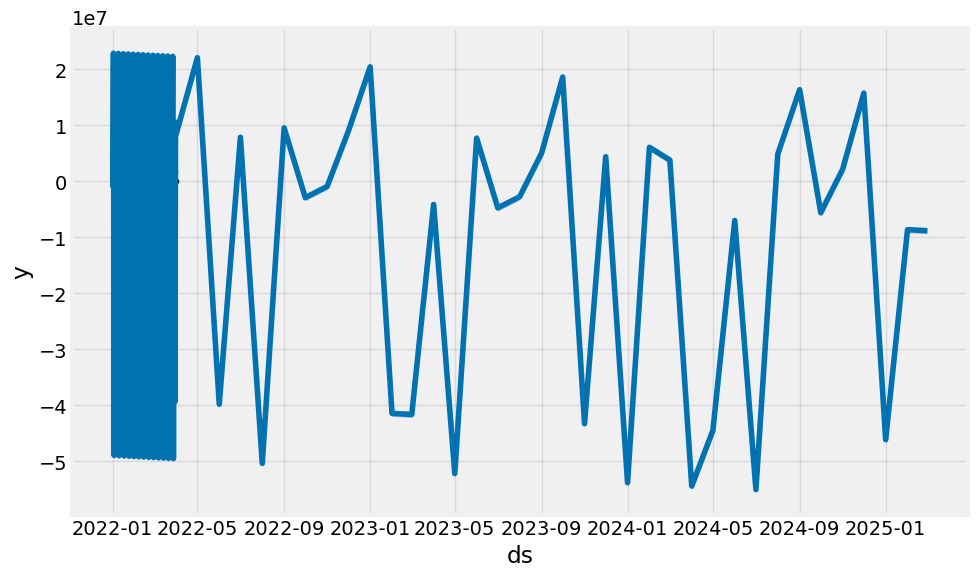

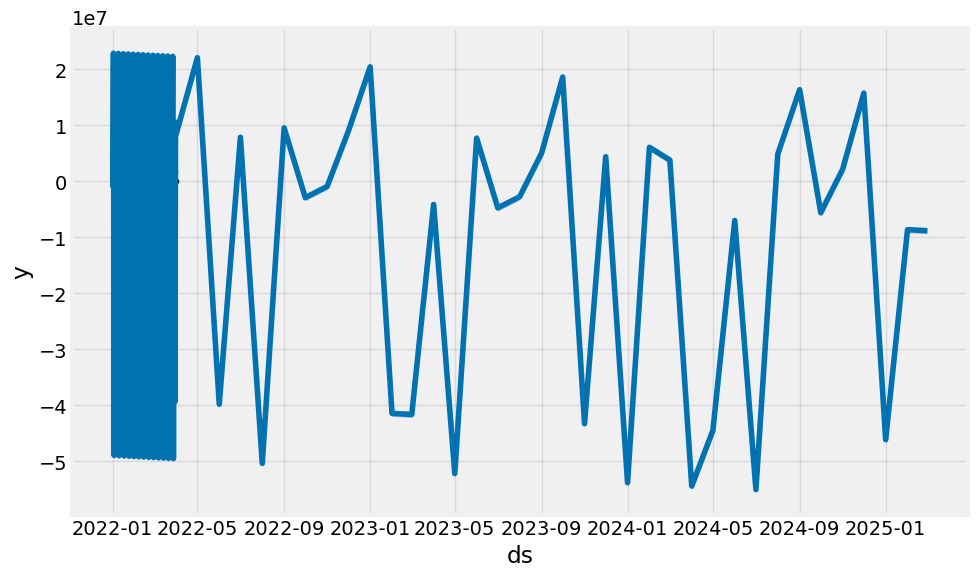

In [56]:
#The first plot is for the yellow taxi 
# The x-axes is dates and the y-axes is number of trips
my_model_yellow.plot(forecast_yellow, uncertainty=True)

The forecast shows 2 thing worth highlighting. The first thing to highlight is that the forecast also inkludes the first quarter of 2022 this is what is shown as the blue block in the left part of the forecast. the second thing we would like to highlight is that the forecast shows that we can expect the amount of taxi rides to change during the year, but in genereal the trend is showing that the amount of taxi rides i falling.   

c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



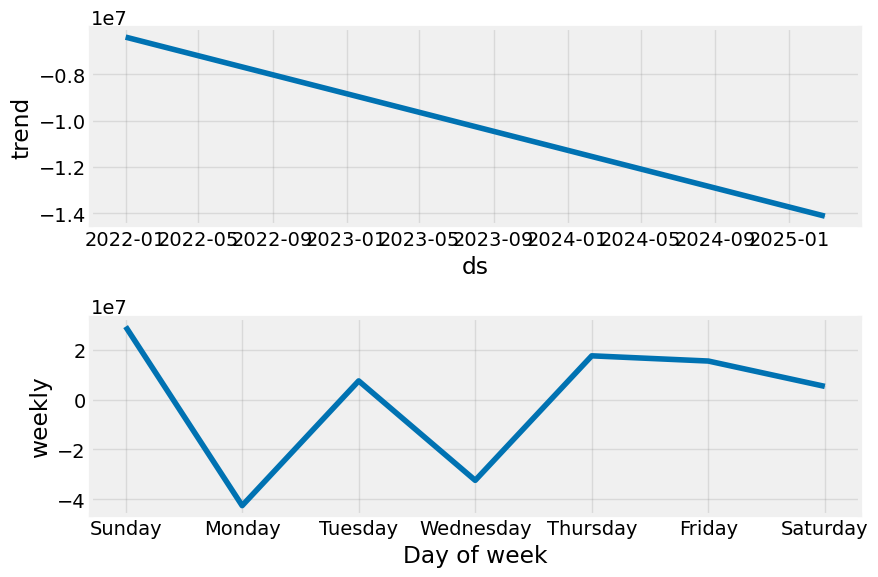

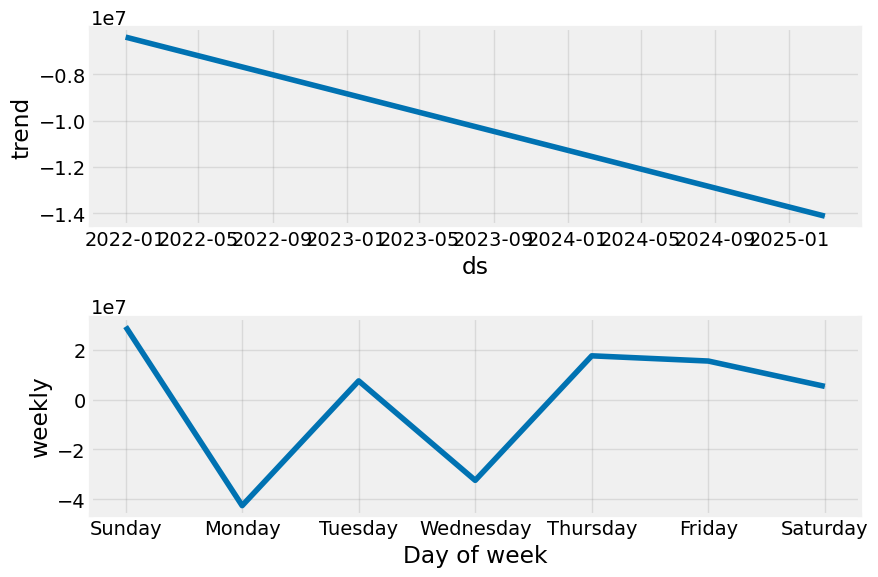

In [50]:
#The first plot show the dates at the x-axes and the y-axes shows the trend
# For the second plot the x-axes is days of the week and the y-axes represent the weekly trend
my_model_yellow.plot_components(forecast_yellow)

The forecast trend graf ones again highlight that the in general the amount of taxi rides is in decline.

The forecast showing the day of the week, then follows up by showing that on sunday, tuesday and thursday there will be an increas in the amount of taxi rides and the rest of the weekdays there will be a decline in taxi rides

This decline is ofcoures what is drinving the general trend to be falling.

In [ ]:
#Nu for den grønne

In [31]:
#We do exactly the same for the green taxi
my_model_green = Prophet(interval_width=0.95)

In [32]:
my_model_green.fit(df_green_1_day)

12:01:13 - cmdstanpy - INFO - Chain [1] start processing
12:01:13 - cmdstanpy - INFO - Chain [1] done processing


In [33]:
future_dates_green = my_model_green.make_future_dataframe(periods=36, freq='MS')
future_dates_green.head()

,ds
0,2022-01-01
1,2022-01-02
2,2022-01-03
3,2022-01-04
4,2022-01-05


In [34]:
forecast_green = my_model_green.predict(future_dates_green)
forecast_green[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2022-01-01,-5910.731510,-16599.666215,4363.714155
1,2022-01-02,179172.828254,169365.782445,189729.592997
2,2022-01-03,-396388.233044,-406805.643414,-386336.904856
3,2022-01-04,23729.635862,14610.285340,33609.922478
4,2022-01-05,-316063.464768,-326251.428541,-306338.308304


c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



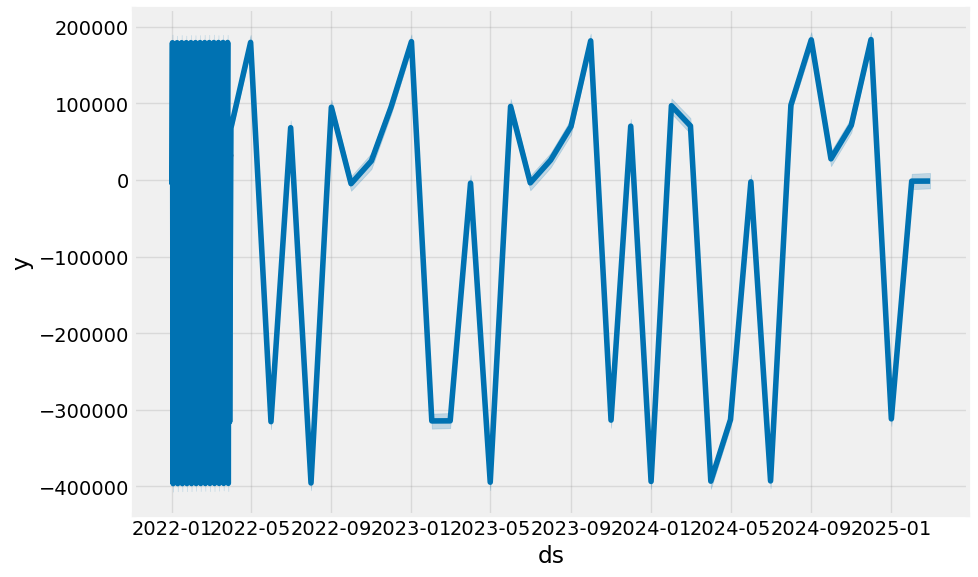

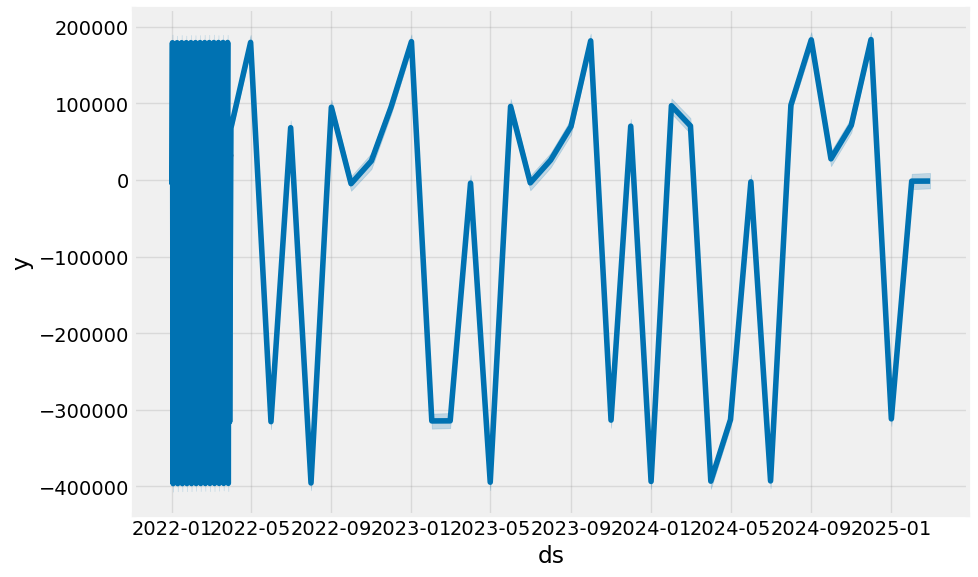

In [35]:
my_model_green.plot(forecast_green, uncertainty=True)

The forecast shows 2 thing worth highlighting. The first thing to highlight is that the forecast also includes the first quarter of 2022 this is what is shown as the blue block in the left part of the forecast. The second thing we would like to highlight is that the forecast shows that we can expect the amount of taxi rides to change during the year, but in genereal the trend is showing that the amount of taxi rides i rising.  

c:\Users\julie\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



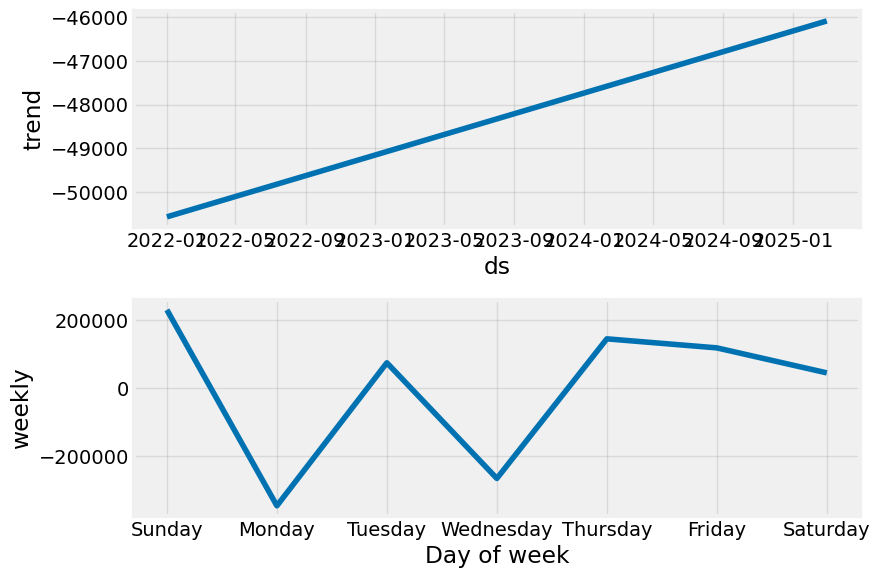

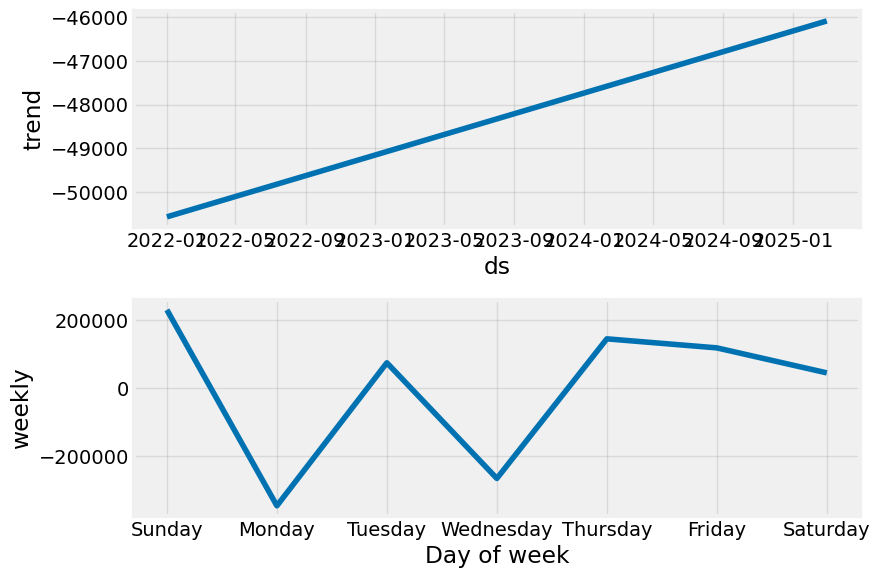

In [36]:
my_model_green.plot_components(forecast_green)

The forecast trend graf ones again highlight that the in general the amount of taxi rides is rising.

The forecast showing the day of the week, then follows up by showing that on sunday, tuesday and thursday there will be an increas in the amount of taxi rides and the rest of the weekdays there will be a decline in taxi rides

This increas is ofcoures what is drinving the general trend to be rise.

### Task 6: Report and Presentation
- Make this project as part of your presentation, **using beamer in LaTeX**. 
- This includes summarizing your methodology, presenting your results, and discussing your conclusions. Also, identify the limitations of your analysis and suggest areas for future research. The **Textbook Practice** parts (that consists of your reflections to the textbook content) are crucial.